# Object Detection Module

In [1]:
import torch
from torch import nn, Tensor
import torchvision
import torchvision.transforms as tf
import numpy as np
import torch.nn as nn
from collections import OrderedDict
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import time
import torchvision.models as models
import torchviz


from dataloader import VOCDataset, collate_fn
from models.resnet import MakeResnet
from models.FPN import BBPredNet, ROIPredNet
from utils.box_utils import GenerateAnchorBoxes, IOU, gen_coord2yxhw

device = 'cuda' if torch.cuda.is_available() else 'cpu'

device = 'cpu'

## Data Preprocessing

In [2]:
train_dataset = VOCDataset(set_type='train')
test_dataset = VOCDataset(set_type='test')


batch_size=100

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)

train_images, train_boxes, train_num_boxes, train_classes = next(iter(train_dataloader))
print(train_images.shape, train_boxes.shape, len(train_num_boxes), train_num_boxes, train_classes.shape)

torch.Size([100, 3, 200, 200]) torch.Size([256, 4]) 100 tensor([ 3,  1,  1,  3,  1,  5,  1,  1,  1,  2,  4,  2,  1,  1,  5,  2,  2,  9,
         3,  2,  2,  2,  1,  1,  1,  3,  2,  3,  2,  2,  5,  2,  4,  3,  2,  1,
         2,  2, 10,  2,  2,  2,  7,  3,  1,  1,  1,  2,  7,  7,  2,  1,  3,  1,
         1,  2,  1,  2,  2,  1,  1,  3,  2,  1,  2,  2,  4,  2,  1,  2,  1,  6,
         4,  2,  2,  2,  2,  2,  2, 13,  3,  1,  2,  1,  2,  4,  1,  2,  1,  2,
         4,  1,  2,  5,  7,  4,  2,  1,  1,  3]) torch.Size([256])


## Conv Model

In [ ]:
# model = MakeResnet([1, 1, 1, 1]).to(device)
resnet18 = models.resnet18(pretrained=True)
model = torch.nn.Sequential(
    nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1),
    nn.BatchNorm2d(num_features=64),
    nn.ReLU(inplace=True),
    *(list(resnet18.children())[4:-2])
    ).to(device)

In [ ]:
out = model(train_images.to(device))
print(out.shape)

## Generating Anchor Boxes

In [ ]:
print(train_boxes.shape, train_classes.shape)

In [ ]:
generate_anchors = GenerateAnchorBoxes()
anchor_proposals_batch, anchor_class_batch, anchor_pos_batch, anchor_gt_batch, anchor_gt_class_batch = generate_anchors.generate_anchors_from_fmap(out.shape[-2:], train_boxes, train_num_boxes, train_classes)

print(anchor_proposals_batch.shape, anchor_class_batch.shape, anchor_pos_batch.shape, anchor_gt_batch.shape, anchor_gt_class_batch.shape)

## Select minibatch proposals

In [ ]:
anchor_gt_xywh_batch = gen_coord2yxhw(anchor_gt_batch)
anchor_proposals_xywh_batch = gen_coord2yxhw(anchor_proposals_batch)

# print(anchor_gt_xywh_batch.shape, anchor_proposals_xywh_batch.shape)
# print(anchor_proposals_xywh_batch)

## Bounding Box Prediction

In [ ]:
FPN = BBPredNet(generate_anchors.box_types).to(device)
fmap_class, fmap_box_xy, fmap_box_wh = FPN(out)

print(fmap_class.shape, fmap_box_xy.shape, fmap_box_wh.shape)

In [ ]:
height_stride = train_images.shape[2]/out.shape[2]
width_stride = train_images.shape[3]/out.shape[3]

print(width_stride, height_stride)

In [ ]:
anchor_proposals_center_batch_fmap = torch.stack([anchor_proposals_xywh_batch[:, :, 0]/height_stride, anchor_proposals_xywh_batch[:, :, 1]/width_stride], dim=2)
anchor_proposals_type_fmap = anchor_pos_batch%9

# print(anchor_proposals_center_batch_fmap.shape, anchor_proposals_type_fmap.shape)
# print(anchor_proposals_center_batch_fmap)

In [ ]:
relu = torch.nn.ReLU()

In [ ]:
bbox_proposal_coord = torch.cat((anchor_proposals_type_fmap[:, :, None], anchor_proposals_center_batch_fmap), dim=2).to(torch.int32)

fmap_bbox_stats_xy = []
fmap_bbox_stats_wh = []
fmap_class_pred = []
roi_boxes = []
roi_classes = []
prev_index = 0

for i in range(train_num_boxes.shape[0]):
    fmap_bbox_stats_xy.append(fmap_box_xy[i, :, bbox_proposal_coord[i, :, 0], bbox_proposal_coord[i, :, 1], bbox_proposal_coord[i, :, 2]].T)
    fmap_bbox_stats_wh.append(fmap_box_wh[i, :, bbox_proposal_coord[i, :, 0], bbox_proposal_coord[i, :, 1], bbox_proposal_coord[i, :, 2]].T)
    fmap_class_pred.append(fmap_class[i, :, bbox_proposal_coord[i, :, 0], bbox_proposal_coord[i, :, 1], bbox_proposal_coord[i, :, 2]].T)
    roi_index = torch.where(anchor_class_batch[i]==1)[0]
    
    roi_index = torch.where(anchor_class_batch[i]==1)[0]

    temp_box = torch.stack([
        fmap_bbox_stats_xy[-1][roi_index, 1] - fmap_bbox_stats_wh[-1][roi_index, 1]/2,
        fmap_bbox_stats_xy[-1][roi_index, 0] - fmap_bbox_stats_wh[-1][roi_index, 0]/2,
        fmap_bbox_stats_xy[-1][roi_index, 1] + fmap_bbox_stats_wh[-1][roi_index, 1]/2,
        fmap_bbox_stats_xy[-1][roi_index, 0] + fmap_bbox_stats_wh[-1][roi_index, 0]/2
    ], dim=1)
    temp_classes = anchor_gt_class_batch[i, roi_index]

    # roi_boxes.append(train_boxes[prev_index:prev_index+train_num_boxes[i], [1, 0, 3, 2]])
    roi_boxes.append(temp_box)
    roi_classes.append(temp_classes)

    prev_index += train_num_boxes[i]
    
#     print(roi_index, fmap_bbox_stats_xy.shape)
#     print(fmap_bbox_stats_xy[0, 0])
#     roi_boxes = torch.stack((fmap_bbox_stats_xy[roi_index, 0]-fmap_bbox_stats_wh[roi_index, 0]/2,
#                 fmap_bbox_stats_xy[roi_index, 1]-fmap_bbox_stats_wh[roi_index, 1]/2,
#                 fmap_bbox_stats_xy[roi_index, 0]+fmap_bbox_stats_wh[roi_index, 0]/2,
#                 fmap_bbox_stats_xy[roi_index, 0]+fmap_bbox_stats_wh[roi_index, 1]/2), dim=1)
    
#     print(roi_boxes.shape)
    
fmap_bbox_stats_xy = torch.stack(fmap_bbox_stats_xy)
fmap_bbox_stats_wh = torch.stack(fmap_bbox_stats_wh)
fmap_class_pred = torch.stack(fmap_class_pred)
roi_classes = torch.cat(roi_classes, dim=0)
    
print(fmap_bbox_stats_xy.shape, fmap_bbox_stats_wh.shape, fmap_class_pred.shape, roi_classes.shape)

In [ ]:
roi_net = ROIPredNet().to(device)
roi_pool = torchvision.ops.roi_pool(input=out, boxes=roi_boxes, output_size=(16, 16), spatial_scale=1/8)
roi_pool_features = roi_net(roi_pool)
print(roi_pool_features.shape)

In [ ]:
CELoss = nn.CrossEntropyLoss()
MSELoss = nn.MSELoss(reduction='none')

In [ ]:
ce_loss = CELoss(fmap_class_pred.view(-1, 2), anchor_class_batch.view(-1))/(train_num_boxes.shape[0]*16)
t_xy = (fmap_bbox_stats_xy - anchor_proposals_xywh_batch[:, :, :2])/anchor_proposals_xywh_batch[:, :, 2:]
t_wh = torch.log(fmap_bbox_stats_wh) - torch.log(anchor_proposals_xywh_batch[:, :, 2:])

t_star_xy = (anchor_gt_xywh_batch[:, :, :2] - anchor_proposals_xywh_batch[:, :, :2])/anchor_proposals_xywh_batch[:, :, 2:]
t_star_wh = torch.log(anchor_gt_xywh_batch[:, :, 2:]) - torch.log(anchor_proposals_xywh_batch[:, :, 2:])

mse_loss = MSELoss(torch.cat((t_xy, t_wh), dim=2), torch.cat((t_star_xy, t_star_wh), dim=2))/(train_num_boxes.shape[0]*16)
mse_loss = torch.mean(mse_loss * anchor_class_batch.unsqueeze(2))

roi_pred_loss = CELoss(roi_pool_features, roi_classes)/(20 * roi_classes.shape[0])
print(roi_pred_loss, ce_loss, mse_loss)

In [ ]:
loss = ce_loss + 1/10 * mse_loss
print(loss, ce_loss, mse_loss)

In [ ]:
loss.backward()

In [ ]:
torchviz.make_dot(loss, dict(model.named_parameters()).update(FPN.named_parameters()))

In [ ]:
optim = torch.optim.SGD(list(model.parameters()) + list(FPN.parameters()), lr=0.1)
optim.step()

## Test

In [11]:
generate_anchors = GenerateAnchorBoxes()
model = MakeResnet([2, 2, 2, 2]).to(device)

# resnet18 = models.resnet18(pretrained=True)
# model = torch.nn.Sequential(
#     nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1),
#     nn.BatchNorm2d(num_features=64),
#     nn.ReLU(inplace=True),
#     *(list(resnet18.children())[4:-2])
#     ).to(device)

print(device)
FPN = BBPredNet(generate_anchors.box_types).to(device)
model.load_state_dict(torch.load('./weights/resnet18_3000.pth', map_location=device))
FPN.load_state_dict(torch.load('./weights/FPN_3000.pth', map_location=device))

cpu


<All keys matched successfully>

In [12]:
test_images, test_boxes, test_num_boxes, test_classes = next(iter(train_dataloader))
print(test_images.shape, test_classes.shape)

torch.Size([100, 3, 200, 200]) torch.Size([241])


In [13]:
out = model(test_images.to(device))

height_stride = train_images.shape[2]/out.shape[2]
width_stride = train_images.shape[3]/out.shape[3]

print(out.shape, height_stride, width_stride)

torch.Size([100, 512, 25, 25]) 8.0 8.0


In [14]:
anchor_proposals_batch, anchor_class_batch, anchor_pos_batch, anchor_gt_batch, anchor_class_batch = generate_anchors.generate_anchors_from_fmap(out.shape[-2:], test_boxes, test_num_boxes, test_classes)
anchor_gt_yxhw_batch = gen_coord2yxhw(anchor_gt_batch)
anchor_proposals_yxhw_batch = gen_coord2yxhw(anchor_proposals_batch)
print(anchor_proposals_batch.shape, anchor_class_batch.shape, anchor_pos_batch.shape, anchor_gt_batch.shape)


# print((anchor_pos_batch[0]/20).to(torch.int32)%6, ((anchor_pos_batch[0]/20).to(torch.int32)/6).to(torch.int32))
# print(anchor_proposals_xywh_batch[0, :, :2]/16)

torch.Size([100, 16, 4]) torch.Size([100, 16]) torch.Size([100, 16]) torch.Size([100, 16, 4])


In [15]:
fmap_class, fmap_box_yx, fmap_box_hw = FPN(out)
softmax = nn.Softmax(dim=1)
fmap_class = softmax(fmap_class)

print(fmap_class.shape, fmap_box_yx.shape, fmap_box_hw.shape)
# pred = torch.stack(torch.where(fmap_class[i, 1]>0.8), dim=1)
# torch.tensor([0, 2 ,4]) in pred
# print(pred)
# print(fmap_class.shape)
# print(fmap_box_yx)

torch.Size([100, 2, 9, 25, 25]) torch.Size([100, 2, 9, 25, 25]) torch.Size([100, 2, 9, 25, 25])


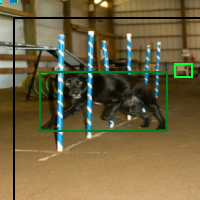

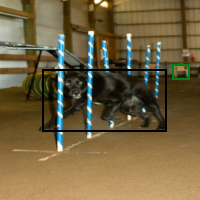

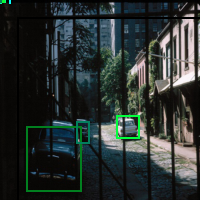

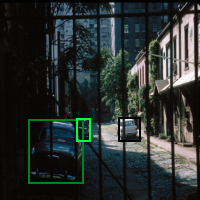

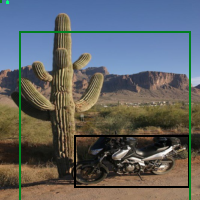

...

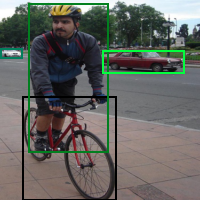

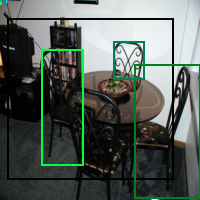

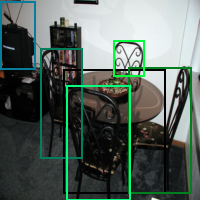

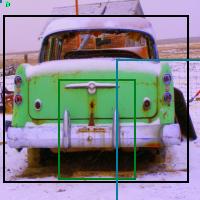

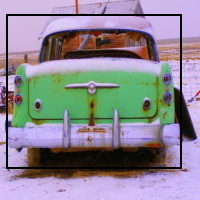

In [16]:
all_boxes = []
all_scores = []

for i in range(100):
    box = []
    scores = []
    pred = torch.stack(torch.where(fmap_class[i, 1]>0.5), dim=1)
    for j in range(pred.shape[0]):
#         if fmap_box_hw[i, 0, pred[j, 0], pred[j, 1], pred[j, 2]]>2 and fmap_box_hw[i, 1, pred[j, 0], pred[j, 1], pred[j, 2]]>2:
        temp_box = torch.tensor([
            fmap_box_yx[i, 0, pred[j, 0], pred[j, 1], pred[j, 2]]-fmap_box_hw[i, 0, pred[j, 0], pred[j, 1], pred[j, 2]]/2,
            fmap_box_yx[i, 1, pred[j, 0], pred[j, 1], pred[j, 2]]-fmap_box_hw[i, 1, pred[j, 0], pred[j, 1], pred[j, 2]]/2,
            fmap_box_yx[i, 0, pred[j, 0], pred[j, 1], pred[j, 2]]+fmap_box_hw[i, 0, pred[j, 0], pred[j, 1], pred[j, 2]]/2,
            fmap_box_yx[i, 1, pred[j, 0], pred[j, 1], pred[j, 2]]+fmap_box_hw[i, 1, pred[j, 0], pred[j, 1], pred[j, 2]]/2
        ])
        box.append(temp_box)
        scores.append(fmap_class[i, 1, pred[j, 0], pred[j, 1], pred[j, 2]])
    all_scores.append(torch.stack(scores))
    all_boxes.append(torch.stack(box))
                    
mean_mat = torch.tensor([0.4485, 0.4250, 0.3920]).view(3, 1, 1).repeat_interleave(200, dim=1).repeat_interleave(200, dim=2)
stddev_mat = torch.tensor([0.2668, 0.2634, 0.2766]).view(3, 1, 1).repeat_interleave(200, dim=1).repeat_interleave(200, dim=2)

topil = tf.ToPILImage()

# # all_boxes = train_boxes
# # all_boxes = torch.stack(box)
# # print(all_boxes)

prev_index = 0
for i in range(100):
    nms_boxes = all_boxes[i][torchvision.ops.nms(all_boxes[i], all_scores[i], iou_threshold=0.25)]
    img = test_images[i] * stddev_mat + mean_mat
    img = (img*255).to(torch.uint8) 
    result1 = torchvision.utils.draw_bounding_boxes(img, nms_boxes[:, [1, 0, 3, 2]], width=2)
    result2 = torchvision.utils.draw_bounding_boxes(img, test_boxes[prev_index:prev_index+test_num_boxes[i]][:, [1, 0, 3, 2]], width=2)
#     result = torchvision.utils.draw_bounding_boxes(img, generate_anchors.anchors[2808:2817, [1, 0, 3, 2]], width=2)
    result1 = topil(result1)
    display(result1)
    result2 = topil(result2)
    display(result2)
    prev_index += test_num_boxes[i]

In [ ]:
topil = tf.ToPILImage()

# all_boxes = train_boxes
all_boxes = torch.cat((positive_anchors, train_boxes))

for i in range(1):
    img = train_images[i]
    img = (img*255).to(torch.uint8) 
    result = torchvision.utils.draw_bounding_boxes(img, all_boxes, width=2)
    
    result = topil(result)
    display(result)
    





# mean_mat = torch.tensor([0.4485, 0.4250, 0.3920]).view(3, 1, 1).repeat_interleave(400, dim=1).repeat_interleave(400, dim=2)
# stddev_mat = torch.tensor([0.2668, 0.2634, 0.2766]).view(3, 1, 1).repeat_interleave(400, dim=1).repeat_interleave(400, dim=2)

# img = img * stddev_mat + mean_mat
        
   
# boxes = torch.stack(boxes)

# print(t1[1]['annotation'])

In [ ]:
# mean = torch.tensor([0., 0., 0.])
# stddev = torch.tensor([0., 0., 0.])

# n_img = 0
# for img, anno in train_dataset:
#     for i in range(3):
#         mean[i] += img[i].mean().item()
    
#     n_img += 1

# mean /= n_img
    
# for img, _ in train_dataset:
#     for i in range(3):
#         stddev[i] += torch.square(img[i]-mean[i]).mean()
    
# stddev = torch.sqrt(stddev/n_img)

# print(mean)
# print(stddev)

In [ ]:
# t1 = train_dataset.__getitem__(5)

# topil = tf.ToPILImage()

# img = t1[0]

# img_size = [float(t1[1]['annotation']['size']['width']), float(t1[1]['annotation']['size']['height'])]
# boxes = []
# for obj in t1[1]['annotation']['object']:
#      boxes.append(torch.tensor([
#          float(obj['bndbox']['xmin'])/img_size[0] * 400,
#          float(obj['bndbox']['ymin'])/img_size[1] * 400,
#          float(obj['bndbox']['xmax'])/img_size[0] * 400,
#          float(obj['bndbox']['ymax'])/img_size[1] * 400
#      ]))

# mean_mat = torch.tensor([0.4485, 0.4250, 0.3920]).view(3, 1, 1).repeat_interleave(400, dim=1).repeat_interleave(400, dim=2)
# stddev_mat = torch.tensor([0.2668, 0.2634, 0.2766]).view(3, 1, 1).repeat_interleave(400, dim=1).repeat_interleave(400, dim=2)

# img = img * stddev_mat + mean_mat
        
# img = (img*255).to(torch.uint8)     
# boxes = torch.stack(boxes)
# result = torchvision.utils.draw_bounding_boxes(img, boxes, width=5)

# result = topil(result)
# display(result)

# print(t1[1]['annotation'])

Model

In [ ]:
a = torch.tensor([[1, 2], [3, 4]])
b = torch.tensor([[0, 1], [1, 1]])
a[1, b]
# b[0]

In [ ]:

# b = torch.tensor([2, 3, 4, 5])
# c = torch.tensor([])

# torch.cat((a,c))

# # # a[:, None] + b
# # a[torch.tensor([2, 3])]
                  
# a = torch.stack()
# a
torch.tensor(list(zip(a[:, 0]/2,a[:, 1]/3)))

In [ ]:
# a = torch.tensor([[-1, -2, 3], [4, 5, 6], [-7, 8, 9], [10, 11, 12]])
# torch.where(torch.all(a>=0, dim=0))[0]

a = torch.tensor([1, -2, 3, 4])
torch.where(a>0)